<a href="https://colab.research.google.com/github/Kitsai/IIA-Projeto1/blob/main/Projeto2/IIA_T2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projeto 2 - Classificação Supervisionada - IIA

###Considerações iniciais

####Alunos:
*   Gabriela de Oliveira Henriques | Matrícula: 211055254
*   Lucas Rocha dos Santos | Matrícula: 211055325

---
####Sobre este projeto:
  Este trabalho, feito na disciplina de Introdução a Inteligência Artificial, lecionada pelo professor Dibio Leandro Borges, e possui o objetivo de analisar um dataset utilizando modelos de classificação LDA, QDA, K-NN, SVM e Random Forest.

  Nesse projeto, será usado um dataset de duas classes: textos produzidos por alunos e textos produzidos por IAs. Cada um dos modelos deve passar por uma fase de treinamento com 70% dos dados entregues e, no final, passará pela fase dos testes de tal forma que classifique os novos dados (os 30% restantes) em cada uma das categorias. No final, será avaliado o ROC-AUC para indicar as precisões dos algorítmos em suas análises.

---
####Especificações:
  O ambiente utilizado para o projeto é o Google Colab e o dataset foi obtido na plataforma Kaggle com o seguinte endereço: https://www.kaggle.com/datasets/prajwaldongre/llm-detect-ai-generated-vs-student-generated-text.



---



#INSTALLATIONS

In [ ]:
!pip install dataprep -q -U
!pip install pandas -q -U
!pip install matplotlib -q -U
!pip install seaborn -q -U
!pip install dataprep -q -U
!pip install sklearn -q -U
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

from dataprep.eda import plot
from dataprep.eda import compute

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 33.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 21.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 234.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

#DATASET


A seed é um número randômico que nesse caso permite que tenhamos testes mais previsiveis. Ele é usada principalmente para a parte de treinos.

In [ ]:
SEED = np.random.seed(42)

Após a seed carregamos um dataframe do pandas com a base de dados.

In [ ]:
data = pd.read_csv('/content/LLM.csv')

In [ ]:
data.head()

,Text,Label
0,y r u always l8 to the meetings?,student
1,The project team embraced a user-centric desig...,ai
2,"i dont like dealing with risks, it's too stres...",student
3,"i dont worry about reliability, it's good enough",student
4,"i dont care about human-centered design, just ...",student


Precisamos cheacar se alguma coluna não possui valores neste caso tiramos os valores nulos para não afetar o resultado final.

In [ ]:
pd.isnull(data).sum()

Text     0
Label    1
dtype: int64

In [ ]:
data.dropna(inplace=True)
pd.isnull(data).sum()

Text     0
Label    0
dtype: int64

Os modelos de ia não conseguem interpretar texto logo ná convertemos as classes "ia" e "student" para um 1 e 0 respectivamente.

In [ ]:
mask = {
    "student": 0,
    "ai": 1
}

data["Label"] = data.Label.map(mask)
data.head()

,Text,Label
0,y r u always l8 to the meetings?,0
1,The project team embraced a user-centric desig...,1
2,"i dont like dealing with risks, it's too stres...",0
3,"i dont worry about reliability, it's good enough",0
4,"i dont care about human-centered design, just ...",0


A seguir temos algumas estatisticas sobre os dados.


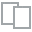
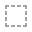
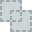
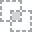
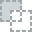
...
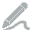
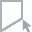
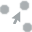
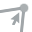
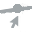

In [ ]:
plot(data, 'Label')

/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))



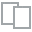
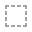
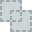
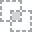
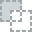
...
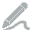
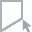
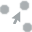
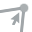
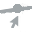

In [ ]:
plot(data, 'Text')

Como dito anteriormente os modelos não sabem analisar texto logo iremos fazer funções para detectar detalhes sobre cada texto.

1. contagem de palavras por texto.



In [ ]:
def count_words(text):
    words = text.split()
    return len(words)

2. contagem de frases por texto

In [ ]:
def count_senteces(text):
    sentences = text.split(r"[.?!]+")
    return len(sentences)

3. contagem de palavras distintas.

In [ ]:
def count_unique_words(text):
    words = set(text.split())
    return len(words)

4. contagem de letras maiúsculas

In [ ]:
def count_uppercase_letters(text):
    uppercase_letters = sum(1 for char in text if char.isupper())
    return uppercase_letters

5. contagem sinais de pntuação e simbolos diversos.

In [ ]:
def count_punctuation(text):
    punctuation = sum(1 for char in text if char in r"[!,.?-_;:']")
    return punctuation

Entrando em cálculos e lógica dos modelos temos:

6. cálculo de tamanho médio das palvaras de cada texto. Porque de modo geral humanos podem usar abreviações ou palavras mais informais.

In [ ]:
def calc_avg_word_lenght(text):
    text = text.replace(r"[!,.?-_;:']", "")
    words = np.array([len(w) for w in text.split()])
    mean = np.mean(words)
    return mean

7. cálculo do desvio padrão do tamanho das palavras. Pelo mesmo motivo da média.

In [ ]:
def calc_std_word_lenght(text):
    text = text.replace(r"[!,.?-_;:']", "")
    words = np.array([len(w) for w in text.split()])
    std = np.std(words)
    return std

8. **Burstiness** é um conceito que envolve a variação de algo pelo tempo. Humanos tendem a ter uma maior explosividade em alternar entre coisas. Um exemplo seria numa histórioa o nome dos personagens é escrito varias vezes no começo mas conforme o avanço do texto esse número cai uma vez que já sabemos o nome dos personagens bem. Nesse caso estamos observando o quanto o tamnaho das palavras é consistente. Isto é, vemos quanto varia o tanho das palavras pelo tempo.

In [ ]:
def calc_burstiness(text):
    mean = calc_avg_word_lenght(text)
    std = calc_std_word_lenght(text)
    burstiness = (std*std)/mean
    return burstiness

9. A próxima parte iremos calcular a previsibilidade de cada texto. Fazemos isso primeiro por cálcular quanto cada palavra aparece nos textos.

In [ ]:
num_words = data.Text.map(count_words).sum()
word_count = pd.Series()
word_count["total"] = num_words
for text in data.Text:
    words = set(text.split())
    for word in words:
        if word.lower() in word_count:
            word_count[word.lower()] += 1
        else:
            word_count[word.lower()] = 1
word_count

<ipython-input-20-c415b5ec34b1>:2: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  word_count = pd.Series()


total       10251
the           847
r               5
to            150
always          2
            ...  
provided        1
age.            1
digital         1
secure          1
media,          1
Length: 1258, dtype: int64

Tendo essas informações usamos uma fórmula descrita nas referências para calcular a previsibilidade de cada palavra e usamos esses dados para calcular a previsibilidade do texto como um todo. Textos de inteligencia artificias são mais previsíveis por serem modelos probabilísticos.

In [ ]:
def calc_perplexity(text):
    text = text.replace(r"[!,.?-_;:']", "")
    count = count_words(text)
    sum = 0
    for word in text.split():
      word_prob = word_count[word.lower()]/word_count['total']
      if word_prob > 0:
        sum += np.log2(word_count[word.lower()]/word_count['total'])
    perplexity = np.power(2, -sum/count)
    return perplexity

---
Feito essas funçoes temos que aplicalas no dataframe que temos.
Primeiramente iremos mapear cada uma das funções na coluna Text do dataframe e colocaremos isso em uma nova coluna.

In [ ]:
data['num_words'] = data.Text.map(count_words)
data['num_sentences'] = data.Text.map(count_senteces)
data['num_unique_words'] = data.Text.map(count_unique_words)
data['num_uppercase_letters'] = data.Text.map(count_uppercase_letters)
data['num_punctuation'] = data.Text.map(count_punctuation)
data.Text.map(count_words)

0        8
1       11
2        9
3        8
4       12
        ..
1098    12
1099    11
1100    11
1101     9
1102     7
Name: Text, Length: 1102, dtype: int64

In [ ]:
data.head()

,Text,Label,num_words,num_sentences,num_unique_words,num_uppercase_letters,num_punctuation
0,y r u always l8 to the meetings?,0,8,1,8,0,1
1,The project team embraced a user-centric desig...,1,11,1,11,1,2
2,"i dont like dealing with risks, it's too stres...",0,9,1,9,0,2
3,"i dont worry about reliability, it's good enough",0,8,1,8,0,2
4,"i dont care about human-centered design, just ...",0,12,1,12,0,2


In [ ]:
data['avg_word_lenght'] = data.Text.map(calc_avg_word_lenght)
data['std_word_lenght'] = data.Text.map(calc_std_word_lenght)
data['burstiness'] = data.Text.map(calc_burstiness)
data['perplexity'] = data.Text.map(calc_perplexity)

In [ ]:
data.head()

,Text,Label,num_words,num_sentences,num_unique_words,num_uppercase_letters,num_punctuation,avg_word_lenght,std_word_lenght,burstiness,perplexity
0,y r u always l8 to the meetings?,0,8,1,8,0,1,3.125000,2.712817,2.355000,816.890282
1,The project team embraced a user-centric desig...,1,11,1,11,1,2,6.454545,3.394210,1.784891,217.947587
2,"i dont like dealing with risks, it's too stres...",0,9,1,9,0,2,4.666667,2.211083,1.047619,172.038848
3,"i dont worry about reliability, it's good enough",0,8,1,8,0,2,5.125000,2.934174,1.679878,158.729761
4,"i dont care about human-centered design, just ...",0,12,1,12,0,2,5.000000,3.188521,2.033333,138.808918


Temos algumas visualizações criadas pela biblioteca dataprep para algumas informações sobre os dados.


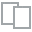
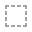
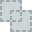
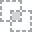
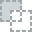
...
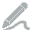
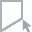
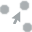
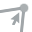
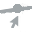

In [ ]:
plot(data)

Como podemos ver nos gráficos acima. A váriavem "num_senteces" é sempre um logo ela não será útil para os modelos. Dessa forma irem descartá-la

In [ ]:
data = data.drop(columns=['num_sentences'])

In [ ]:
data.head()

,Text,Label,num_words,num_unique_words,num_uppercase_letters,num_punctuation,avg_word_lenght,std_word_lenght,burstiness,perplexity
0,y r u always l8 to the meetings?,0,8,8,0,1,3.125000,2.712817,2.355000,816.890282
1,The project team embraced a user-centric desig...,1,11,11,1,2,6.454545,3.394210,1.784891,217.947587
2,"i dont like dealing with risks, it's too stres...",0,9,9,0,2,4.666667,2.211083,1.047619,172.038848
3,"i dont worry about reliability, it's good enough",0,8,8,0,2,5.125000,2.934174,1.679878,158.729761
4,"i dont care about human-centered design, just ...",0,12,12,0,2,5.000000,3.188521,2.033333,138.808918


Feito esse tratamento dos dados.
Separamos como X o eixo das variáveis que usaremos para serem avaliadas e Y como o eixo das respectivas classes.

In [ ]:
X = data.drop(columns=['Label', 'Text'])
Y = data['Label']

In [ ]:
X.head()

,num_words,num_unique_words,num_uppercase_letters,num_punctuation,avg_word_lenght,std_word_lenght,burstiness,perplexity
0,8,8,0,1,3.125000,2.712817,2.355000,816.890282
1,11,11,1,2,6.454545,3.394210,1.784891,217.947587
2,9,9,0,2,4.666667,2.211083,1.047619,172.038848
3,8,8,0,2,5.125000,2.934174,1.679878,158.729761
4,12,12,0,2,5.000000,3.188521,2.033333,138.808918


In [ ]:
Y.head()

0    0
1    1
2    0
3    0
4    0
Name: Label, dtype: int64

Feito isso usamos o sci-kit learn para separar os dados de treino e de teste. Usando 70% para treino e 30% para teste. Além disso estratificamos os dados com base no Y para a randomização ser proporcional à amostra.

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, stratify=Y, random_state=4)

Depois disso usamos um Scaler do sk-learn para normalizar os dados e manter todas as colunas na mesma proporção.

In [ ]:
sc_X = StandardScaler()
x_train = sc_X.fit_transform(x_train)
x_test = sc_X.transform(x_test)

Por fim antes de passar para os modelos criamos uma Série do Pandas para salvar os resultados das predições.

In [ ]:
sr_predictions = pd.Series()

<ipython-input-34-188eb476f9d8>:1: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  sr_predictions = pd.Series()


---

#LDA - Linear discriminant analysis

No modelo LDA, obtivemos uma acurácia de 97,8% e um AUC de 97,8%.

 Análise Discriminante Linear (LDA) é um algoritmo de aprendizado de máquina supervisionado que encontra a melhor linha (ou hiperplano) para separar diferentes categorias em um conjunto de dados. Ele projeta os dados em uma nova dimensão que maximiza a separação entre as categorias e, em seguida, define um limite de decisão para classificar novos pontos de dados.

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

model = LDA()
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["LDA"] = predictions

Accuracy: 0.9788519637462235
AUC: 0.9788426433004745


---
#QDA

No qda obtivemos 96.67


A Análise Discriminante Quadrática (QDA) é similar ao LDA, buscando a melhor separação entre categorias em um conjunto de dados. No entanto, o QDA é mais flexível, pois permite que cada categoria tenha sua própria matriz de covariância, resultando em limites de decisão não-lineares, como parábolas ou elipses.

In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

model = QDA()
model.fit(x_train, y_train)

predictions =  model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["QDA"] = predictions

Accuracy: 0.9667673716012085
AUC: 0.9667579408543264


---
#K-NN

No modelo K-nn testamos com alguns k diferentes com 1 e 5 obetendo a mesma acurácia de 98,85% e AUC de 0,9889

O knn funciona na ideia de vizinhos mais próximos isto é cada dado será comparado com seus k vizinhos e a a classe em maioria será escolhida.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier as KNN

model = KNN(n_neighbors=1)
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["KNN_1"] = predictions

Accuracy: 0.9848942598187311
AUC: 0.9848667396860168


In [ ]:
from sklearn.neighbors import KNeighborsClassifier as KNN

model = KNN(n_neighbors=3)
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["KNN_3"] = predictions

Accuracy: 0.9818731117824774
AUC: 0.9818181818181818


In [ ]:
from sklearn.neighbors import KNeighborsClassifier as KNN

model = KNN(n_neighbors=5)
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["KNN_5"] = predictions

Accuracy: 0.9848942598187311
AUC: 0.9848484848484849


---
#Random Forest

Na floresta randomica obtivemos 99,70% de acurácia e 0,9969 de AUC

A floresta randomica se baseia em utilizar árvore de decisão aoplicando a estratégia de Bagging mas escolhendo os preditores randomicamente.

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["RF"] = predictions

Accuracy: 0.9969788519637462
AUC: 0.996969696969697


---
#SVM

No SVM Testamos para todos os kernels disponibilizados por padrão e obtivemos no melhor caso 98,78% de acurácia e 0,9878 de AUC com o kernel radial.

O SVM usa a ideia de vetores de suporte para achar uma reta que divide os dados. Caso eles não sejam lineares pode-se usar a estratégia dos kernels para transformar o espaço dos dados em um espaço onde eles sejam mais facilmente separáveis linearmente.

In [ ]:
from sklearn.svm import SVC

model = SVC(kernel='linear')
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["SVM_linear"] = predictions

Accuracy: 0.9848942598187311
AUC: 0.9848484848484849


In [ ]:
from sklearn.svm import SVC

model = SVC(kernel='poly')
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["SVM_poly"] = predictions

Accuracy: 0.9758308157099698
AUC: 0.9757575757575758


In [ ]:
from sklearn.svm import SVC

model = SVC(kernel='rbf', gamma='auto')
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["SVM_rbf"] = predictions

Accuracy: 0.9879154078549849
AUC: 0.9878787878787878


In [ ]:
from sklearn.svm import SVC

model = SVC(kernel='sigmoid')
model.fit(x_train, y_train)

predictions = model.predict(x_test)

accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)
auc_score = roc_auc_score(y_test, predictions)
print("AUC:", auc_score)
sr_predictions["SVM_sigmoid"] = predictions

Accuracy: 0.9093655589123867
AUC: 0.9093829864914202


---
#ROC E AUC - CONCLUSÕES

Tendo todas as previsões podemos calcular o gráfico roc-auc desses modelos.

In [ ]:
sr_predictions

LDA            [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
QDA            [0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, ...
KNN_1          [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
KNN_3          [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
KNN_5          [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
RF             [0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
SVM_linear     [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
SVM_poly       [0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
SVM_rbf        [0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
SVM_sigmoid    [0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, ...
dtype: object

In [ ]:
sr_predictions.index

Index(['LDA', 'QDA', 'KNN_1', 'KNN_3', 'KNN_5', 'RF', 'SVM_linear', 'SVM_poly',
       'SVM_rbf', 'SVM_sigmoid'],
      dtype='object')

Calculamos para cada classificador a sua roc curve e seu auc e plotamos isso em um gráfico.

In [ ]:
plt.figure(figsize=(10,10), dpi=1000)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

for classifier in sr_predictions.index:
  fpr, tpr, thresholds = roc_curve(y_test, sr_predictions[classifier])
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr, tpr, label=classifier + ' (AUC = %0.3f)' % roc_auc, marker='.')


plt.legend(loc='lower right')

plt.grid(True)

plt.show()

---
#REFERÊNCIAS




*   https://medium.com/@bedigunjit/simple-guide-to-text-classification-nlp-using-svm-and-naive-bayes-with-python-421db3a72d34
* https://en.wikipedia.org/wiki/Burstiness
* https://originality.ai/blog/perplexity-and-burstiness-in-writing

